In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, Conv2DTranspose, Input
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:

path_zip = '/content/drive/MyDrive/ImageDenoising/'
path = '/content/drive/MyDrive/ImageDenoising/'


with zipfile.ZipFile(path_zip + 'train.zip', 'r') as zip_ref:
    zip_ref.extractall(path)

with zipfile.ZipFile(path_zip + 'test.zip', 'r') as zip_ref:
    zip_ref.extractall(path)

with zipfile.ZipFile(path_zip + 'train_cleaned.zip', 'r') as zip_ref:
    zip_ref.extractall(path)


In [ ]:
# store image names in list for later use
train_img = sorted(os.listdir(path + '/train'))
train_cleaned_img = sorted(os.listdir(path + '/train_cleaned'))
test_img = sorted(os.listdir(path + '/test'))

In [ ]:
if train_img == train_cleaned_img:
  print("Checked")


Checked


In [ ]:
# preprocess images
def process_image(path):
    img = cv2.imread(path)
    img = np.asarray(img, dtype="float32")
    img = cv2.resize(img, (540, 420))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img/255.0
    #img = np.reshape(img, (540, 420, 1))
    img = np.reshape(img, (420, 540, 1))

    return img

In [ ]:

train = []
train_cleaned = []
test = []

for f in sorted(os.listdir(path + 'train/')):
    train.append(process_image(path + 'train/' + f))

for f in sorted(os.listdir(path + 'train_cleaned/')):
    train_cleaned.append(process_image(path + 'train_cleaned/' + f))

for f in sorted(os.listdir(path + 'test/')):
    test.append(process_image(path + 'test/' + f))


In [ ]:
checkign_image = path + '/train/'+train_img[100]
checkign_image_Clean = path + '/train_cleaned/'+train_cleaned_img[100]
img = cv2.imread(checkign_image)
img_cleaned = cv2.imread(checkign_image_Clean)


In [ ]:
#img

In [ ]:
#img.shape

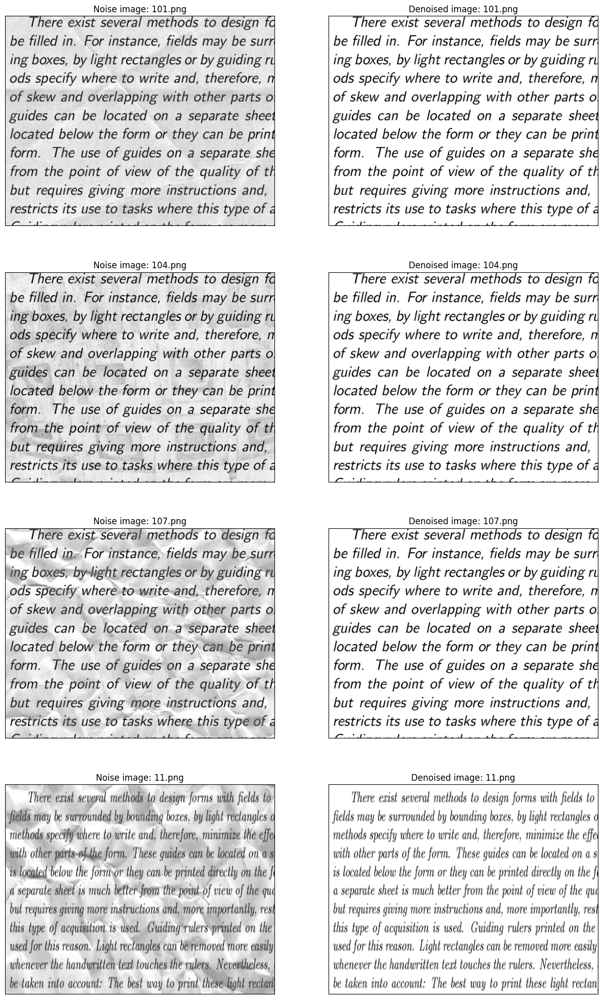

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

In [ ]:
# convert list to numpy array
X_train = np.asarray(train)
y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2)

In [ ]:
print("Xtrain: "+str(X_train.shape))
print("Xval: "+str(X_val.shape))
print("ytrain: "+str(y_train.shape))
print("yval: "+str(y_val.shape))

Xtrain: (115, 420, 540, 1)
Xval: (29, 420, 540, 1)
ytrain: (115, 420, 540, 1)
yval: (29, 420, 540, 1)


In [ ]:
conv_autoencoder = Sequential()

# Encoding
conv_autoencoder.add(Conv2D(filters=32, kernel_size=(3,3), input_shape=(420,540,1), activation='relu', padding='same'))
conv_autoencoder.add(MaxPooling2D((2, 2), padding='same'))

conv_autoencoder.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
conv_autoencoder.add(MaxPooling2D((2, 2), padding='same'))



# Decoding
conv_autoencoder.add(Conv2DTranspose(8, kernel_size=3, strides=2, activation='relu', padding='same'))
conv_autoencoder.add(Conv2DTranspose(16, kernel_size=3, strides=2, activation='relu', padding='same'))


# Reconstructing
conv_autoencoder.add(Conv2D(filters=1, kernel_size=(3,3), activation='sigmoid', padding='same'))
conv_autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
conv_autoencoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 420, 540, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 210, 270, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 210, 270, 16)      4624      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 105, 135, 16)     0         
 2D)                                                             
                                                                 
 conv2d_transpose (Conv2DTra  (None, 210, 270, 8)      1160      
 nspose)                                                         
                                                        

In [ ]:
conv_autoencoder2 = Sequential()

# Encoding
conv_autoencoder2.add(Conv2D(filters=64, kernel_size=(3,3), input_shape=(420,540,1), activation='relu', padding='same'))
conv_autoencoder2.add(MaxPooling2D((2, 2), padding='same'))

conv_autoencoder2.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='same'))
conv_autoencoder2.add(MaxPooling2D((2, 2), padding='same'))




# Decoding
conv_autoencoder2.add(Conv2DTranspose(16, kernel_size=3, strides=2, activation='relu', padding='same'))
conv_autoencoder2.add(Conv2DTranspose(32, kernel_size=3, strides=2, activation='relu', padding='same'))


# Reconstructing
conv_autoencoder2.add(Conv2D(filters=1, kernel_size=(3,3), activation='sigmoid', padding='same'))
conv_autoencoder2.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

conv_autoencoder2.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 420, 540, 64)      640       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 210, 270, 64)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 210, 270, 32)      18464     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 105, 135, 32)     0         
 2D)                                                             
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 210, 270, 16)     4624      
 ranspose)                                                       
                                                      

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(420,540,1)))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))


model.add(MaxPooling2D((2, 2), padding='same'))

model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(1, (3, 3), activation='relu', padding='same'))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 420, 540, 32)      320       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 210, 270, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 210, 270, 8)       2312      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 105, 135, 8)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 105, 135, 8)       584       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 53, 68, 8)       

In [ ]:
early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)
history1= conv_autoencoder.fit(X_train, y_train, validation_data = (X_val, y_val), epochs=200, batch_size=16, callbacks= [early_stop])
history2= conv_autoencoder2.fit(X_train, y_train, validation_data = (X_val, y_val), epochs=200, batch_size=16, callbacks= [early_stop])
history3= model.fit(X_train, y_train, validation_data = (X_val, y_val), epochs=200, batch_size=16, callbacks= [early_stop])

Epoch 1/200
8/8 [==============================] - 17s 324ms/step - loss: 0.2195 - mae: 0.4546 - val_loss: 0.2152 - val_mae: 0.4499
Epoch 2/200
8/8 [==============================] - 1s 119ms/step - loss: 0.2124 - mae: 0.4473 - val_loss: 0.2050 - val_mae: 0.4393
Epoch 3/200
8/8 [==============================] - 1s 119ms/step - loss: 0.1974 - mae: 0.4313 - val_loss: 0.1786 - val_mae: 0.4099
Epoch 4/200
8/8 [==============================] - 1s 119ms/step - loss: 0.1583 - mae: 0.3845 - val_loss: 0.1174 - val_mae: 0.3246
Epoch 5/200
8/8 [==============================] - 1s 110ms/step - loss: 0.0937 - mae: 0.2683 - val_loss: 0.0707 - val_mae: 0.1812
Epoch 6/200
8/8 [==============================] - 1s 121ms/step - loss: 0.0719 - mae: 0.1529 - val_loss: 0.0730 - val_mae: 0.1290
Epoch 7/200
8/8 [==============================] - 1s 119ms/step - loss: 0.0747 - mae: 0.1265 - val_loss: 0.0735 - val_mae: 0.1258
Epoch 8/200
8/8 [==============================] - 1s 125ms/step - loss: 0.0737 - 

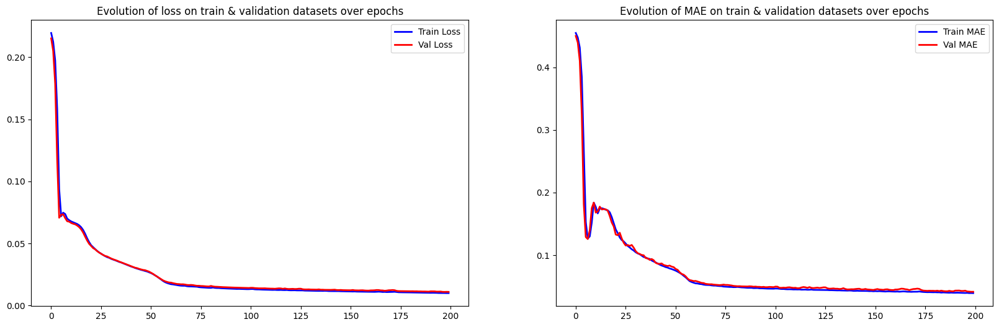

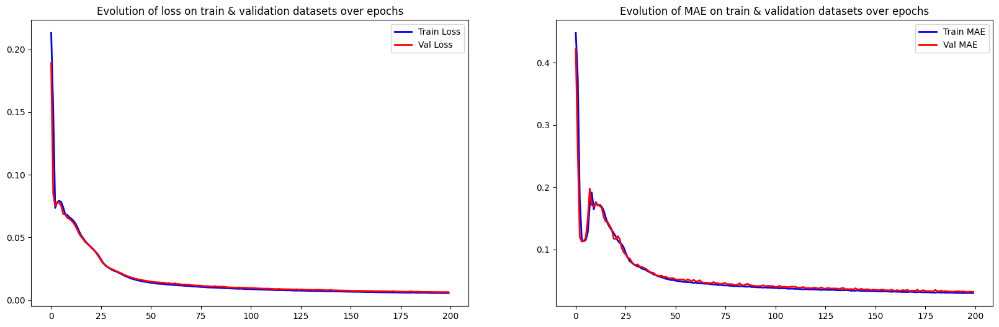

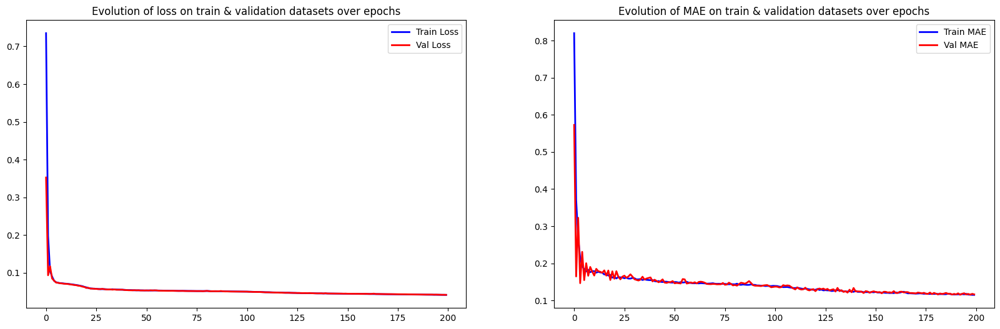

In [ ]:
#
History=[history1,history2,history3]
for history in History:

  epoch_loss = history.history['loss']
  epoch_val_loss = history.history['val_loss']
  epoch_mae = history.history['mae']
  epoch_val_mae = history.history['val_mae']

  plt.figure(figsize=(20,6))
  plt.subplot(1,2,1)
  plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
  plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
  plt.title('Evolution of loss on train & validation datasets over epochs')
  plt.legend(loc='best')

  plt.subplot(1,2,2)
  plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
  plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
  plt.title('Evolution of MAE on train & validation datasets over epochs')
  plt.legend(loc='best')

  plt.show()

In [ ]:
#Checking for convo layers only
for layer in conv_autoencoder.layers:
  if 'conv' not in layer.name:
    continue
  filters, biases = layer.get_weights()
  print(layer.name, filters.shape)

conv2d (3, 3, 1, 32)
conv2d_1 (3, 3, 32, 16)
conv2d_transpose (3, 3, 8, 16)
conv2d_transpose_1 (3, 3, 16, 8)
conv2d_2 (3, 3, 16, 1)


In [ ]:
#Normalizing filters
filters, biases = model.layers[0].get_weights()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

In [ ]:
filters.shape

(3, 3, 16, 1)

Some filters are shown here !

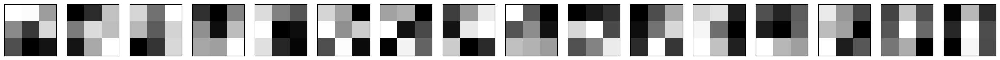

In [ ]:
n_filters, ix = filters.shape[3], 1
plt.figure(figsize=(30,30))
for i in range(n_filters):
	f = filters[:, :, :, i]
	for j in range(filters.shape[2]):
		ax = plt.subplot(n_filters, filters.shape[2], ix)
		ax.set_xticks([])
		ax.set_yticks([])

		plt.imshow(f[:, :, j], cmap='gray')
		ix += 1
plt.show()

In [ ]:
for i in range(len(conv_autoencoder.layers)):
  layer = conv_autoencoder.layers[i]
  if 'conv' not in layer.name:
    continue
  print(i, layer.name, layer.output.shape)

0 conv2d (None, 420, 540, 32)
2 conv2d_1 (None, 210, 270, 16)
4 conv2d_transpose (None, 210, 270, 8)
5 conv2d_transpose_1 (None, 420, 540, 16)
6 conv2d_2 (None, 420, 540, 1)


In [ ]:

from tensorflow.keras import Model
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[0].output)

Now lets consider a test image and then predict the img for this test img and then compare. Also drawing its feature maps !!

Text(0.5, 1.0, 'Test image : 1.png')

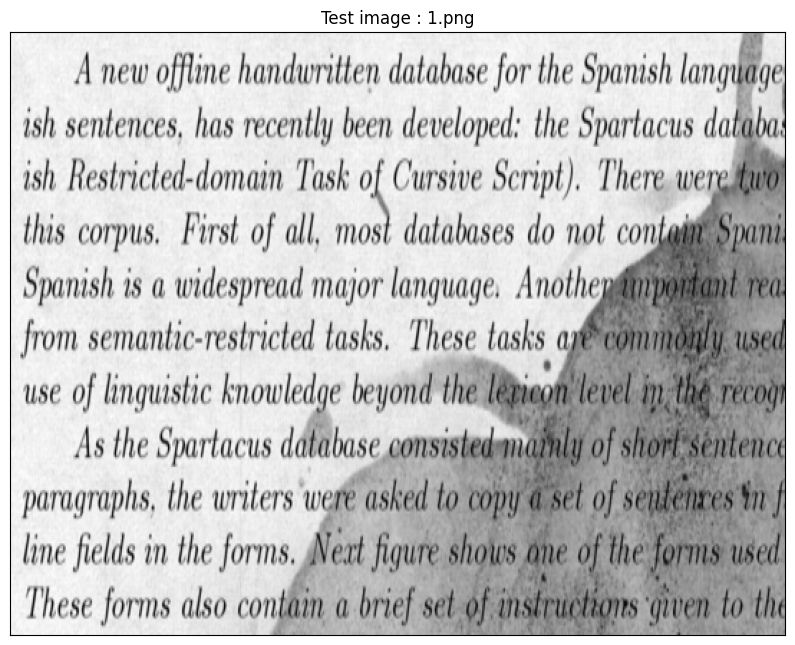

In [ ]:
#Test img
plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(X_test[0][:,:,0], cmap='gray')
plt.title('Test image : {}'.format(test_img[0]))

In [ ]:
test_img = X_test[0][:,:,:]

In [ ]:
#test_img.shape

(420, 540, 1)

In [ ]:
conv_autoencoder.inputs


[<KerasTensor: shape=(None, 420, 540, 1) dtype=float32 (created by layer 'conv2d_input')>]

In [ ]:
test_img = np.reshape(test_img, (1,420, 540, 1))

Feature maps start here


1/1 [==============================] - 0s 30ms/step


<ipython-input-48-243b0efd33e4>:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(8, 4, ix)


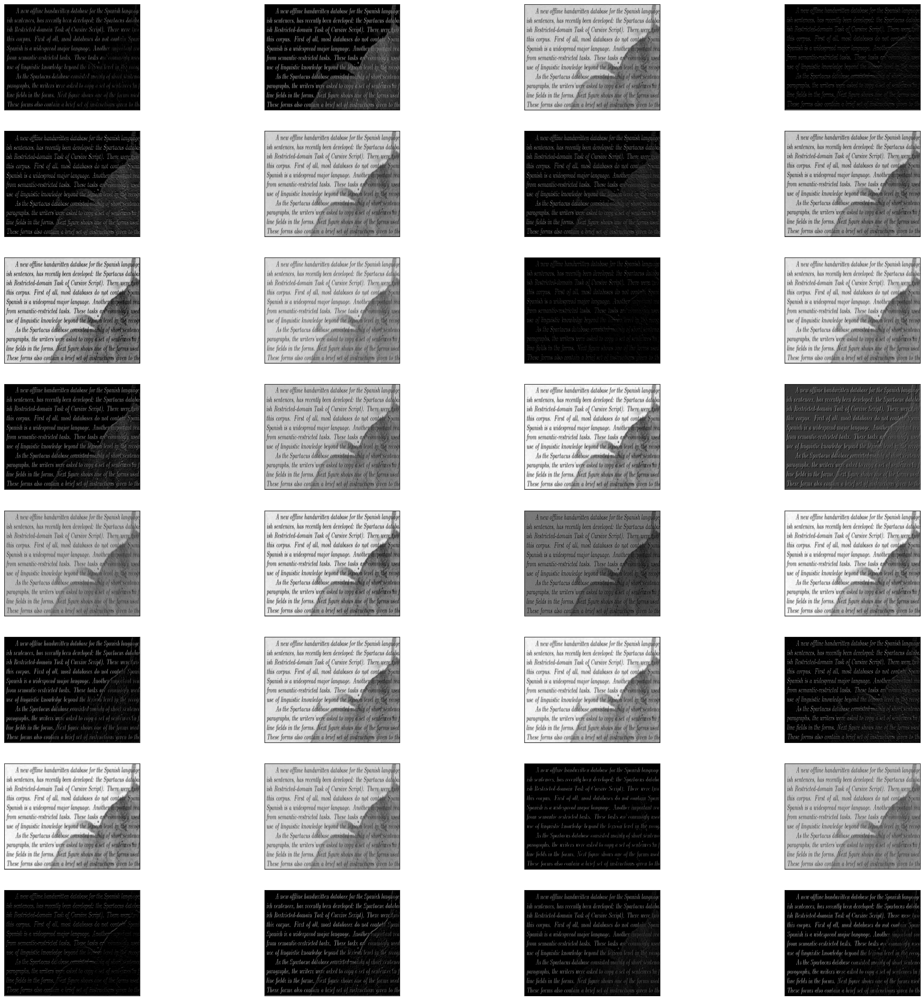

In [ ]:
feature_maps = featuring_model.predict(test_img)
square = 32
ix = 1
plt.figure(figsize=(30,30))
plt.title('Feature map of 1st convolutional layer(index 0)')
for _ in range(square):

		ax = plt.subplot(8, 4, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1

plt.show()


1/1 [==============================] - 0s 50ms/step


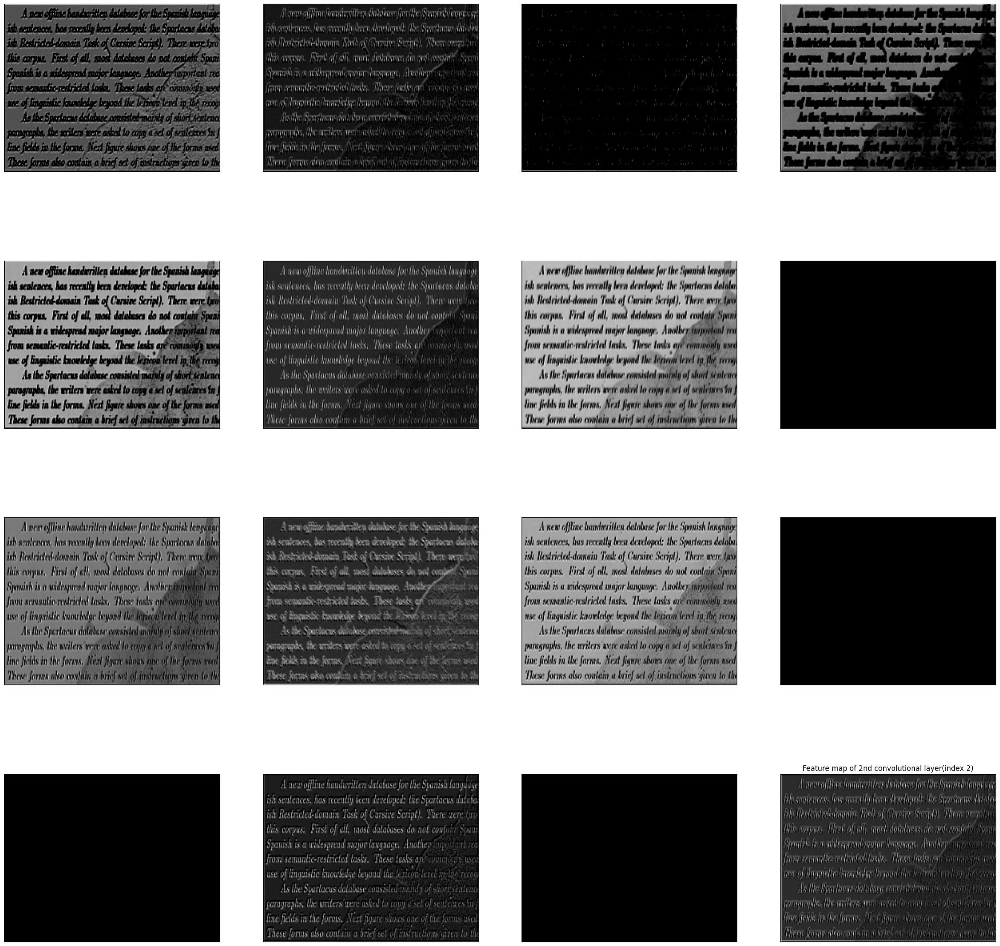

In [ ]:
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[2].output)
feature_maps = featuring_model.predict(test_img)
# plot all 64 maps in an 8x8 squares
square = 16
ix = 1
plt.figure(figsize=(30,30))


for _ in range(square):
		# specify subplot and turn of axis
		ax = plt.subplot(4, 4, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1
# show the figure
plt.title("Feature map of 2nd convolutional layer(index 2)")
plt.show()


1/1 [==============================] - 0s 132ms/step


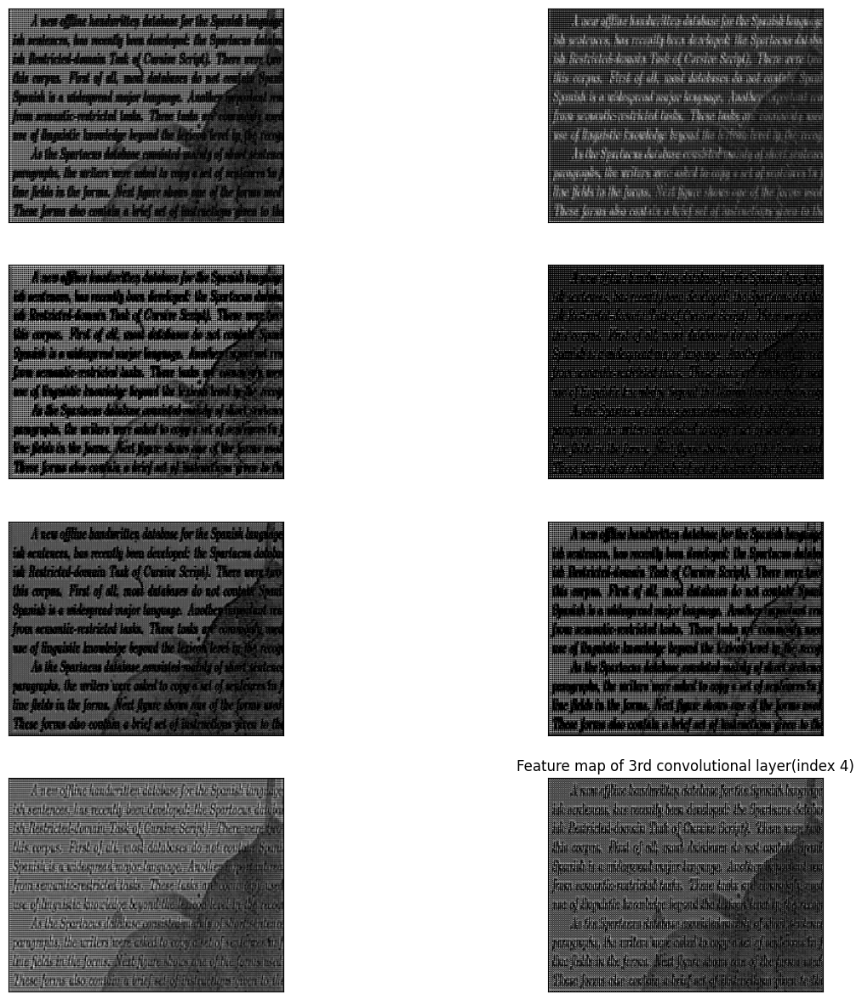

In [ ]:
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[4].output)
feature_maps = featuring_model.predict(test_img)
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
plt.figure(figsize=(15,15))


for _ in range(square):
		# specify subplot and turn of axis
		ax = plt.subplot(4, 2, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1
# show the figure
plt.title("Feature map of 3rd convolutional layer(index 4)")
plt.show()

1/1 [==============================] - 0s 147ms/step


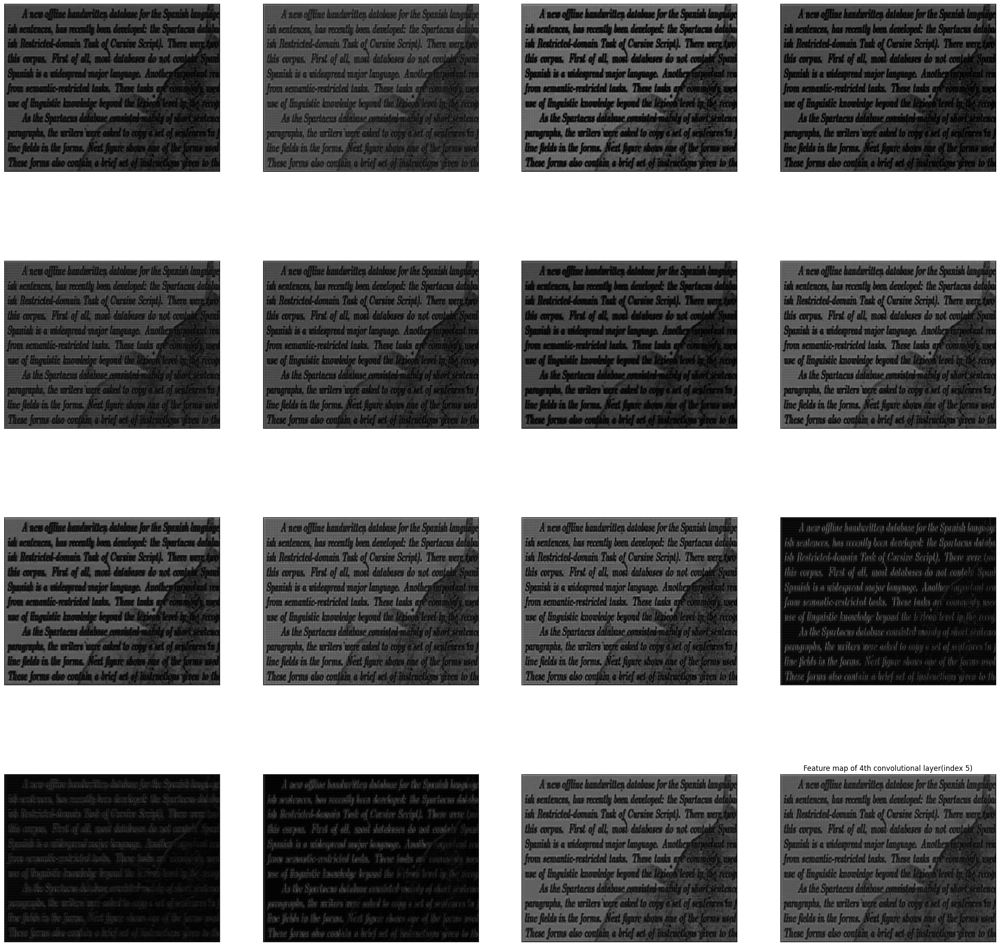

In [ ]:
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[5].output)
feature_maps = featuring_model.predict(test_img)
# plot all 64 maps in an 8x8 squares
square = 16
ix = 1
plt.figure(figsize=(30,30))


for _ in range(square):
		# specify subplot and turn of axis
		ax = plt.subplot(4, 4, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1
# show the figure
plt.title("Feature map of 4th convolutional layer(index 5)")
plt.show()

1/1 [==============================] - 0s 200ms/step


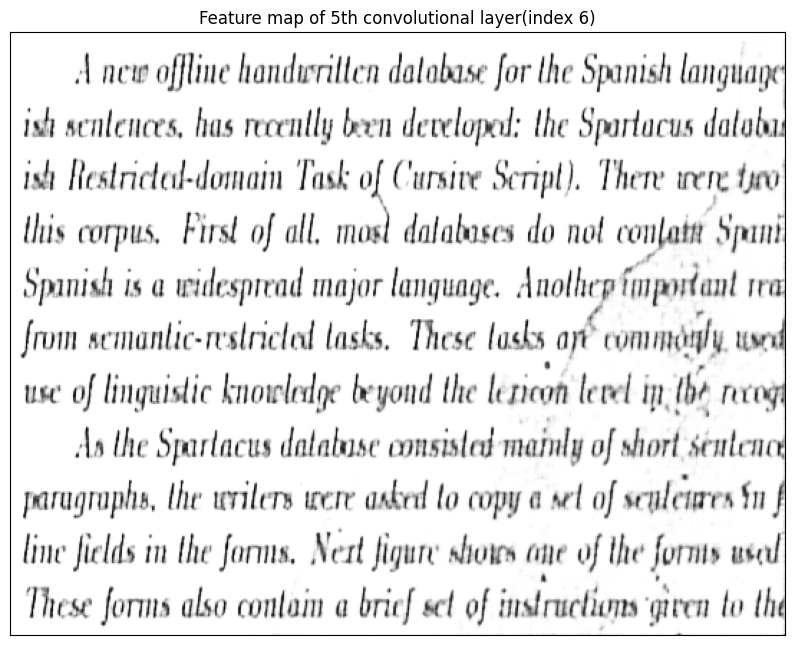

In [ ]:
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[6].output)
feature_maps = featuring_model.predict(test_img)
# plot all 64 maps in an 8x8 squares
square = 1
ix = 1
plt.figure(figsize=(10,10))


for _ in range(square):
		# specify subplot and turn of axis
		ax = plt.subplot(1, 1, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1
# show the figure
plt.title("Feature map of 5th convolutional layer(index 6)")
plt.show()

test Image and its prediction comparison.

Comparison: 
1/1 [==============================] - 0s 136ms/step


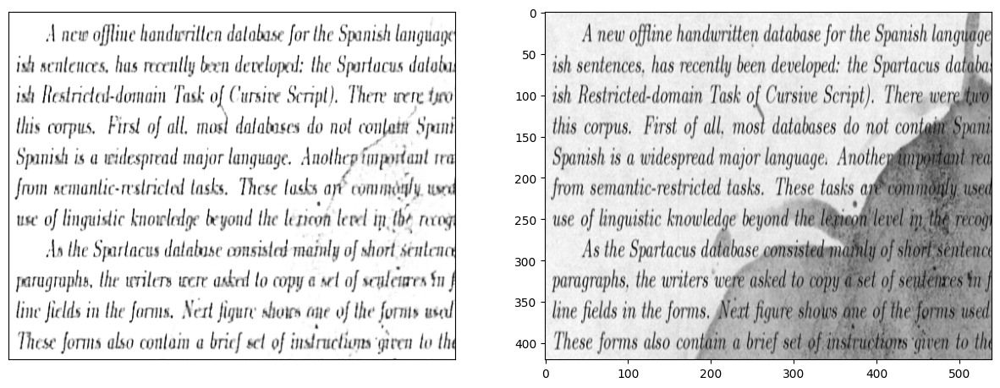

In [ ]:
print("Comparison: ")
featuring_model = Model(inputs=conv_autoencoder.inputs, outputs=conv_autoencoder.layers[6].output)
feature_maps = featuring_model.predict(test_img)
# plot all 64 maps in an 8x8 squares
square = 1
ix = 1
plt.figure(figsize=(15,15))


for _ in range(square):
		# specify subplot and turn of axis
		ax = plt.subplot(1, 2, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
		ix += 1
# show the figure
plt.subplot(1,2,2)
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(X_test[0][:,:,0], cmap='gray')
plt.show()